# Plot Concept Graphs

### Libs

In [1]:
import athena as ath
import matplotlib.pyplot as plt
import pickle
import numpy as np
from matplotlib.colors import ListedColormap
import os
from ruamel import yaml

### Read in SO object and configs

In [2]:
path_2_file = '/Users/ast/Documents/GitHub/datasets/jakson/intermediate_data/so_w_graphs.pkl'
with open(path_2_file, 'rb') as f:
    so = pickle.load(f)

In [3]:
path_2_file = "/Users/ast/Documents/GitHub/datasets/jakson/prediction_tasks/ERStatus/configs/dataset_configs"
cfgs = []
for file in os.listdir(path_2_file):

    if file.endswith(".yaml"):
        # Constructing full path
        file_path = os.path.join(path_2_file, file)

        # reading the data from the file
        with open(file_path, "r") as f:
            cfg = yaml.load(f, Loader=yaml.Loader)

        # append to list
        cfgs.append(cfg)

### Make graphs

In [4]:
# Get sample
for i in so.spl.index.values:
    if "slide_7_Cy2x2" in i:
        spl=i

In [5]:
# Extract centroids
ath.pp.extract_centroids(so, spl, mask_key='cellmasks')

In [6]:
# Build Graphs
for cfg in cfgs:
    ath.graph.build_graph(so, 
                        spl, 
                        builder_type=cfg["builder_type"],
                        config=cfg, 
                        key_added=cfg["concept_name"])

100%|██████████| 667/667 [00:20<00:00, 33.21it/s]


### Plot segmentatinon masks

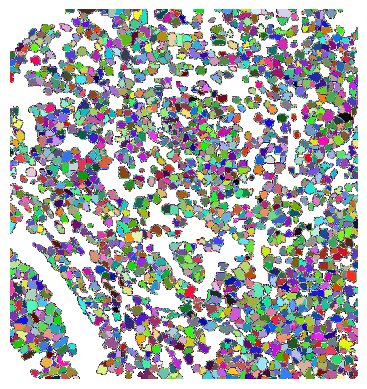

In [18]:

segmentation = so.masks[spl]["cellmasks"]

# Get the unique segment labels
labels = np.unique(segmentation)

# Generate random colors for each label
num_colors = len(labels)
colors = np.random.rand(num_colors, 3)
colors[0]=1 # Background to 0

# Create a ListedColormap with the colors
cmap = ListedColormap(colors)

# Plot the colored segmentation image
plt.imshow(segmentation, cmap=cmap, origin="lower")

# Remove axis ticks
plt.axis('off')

# Show the plot
plt.savefig("/Users/ast/Downloads/results/cell_masks.png", bbox_inches='tight', dpi=300)
plt.show()


### Plot concept graphs

In [6]:
# Define a list of colorblind-friendly colors
colors = {
    'Vessel':'#0072B2',
    'Tumor':'#009E73', 
    'Immune':'#D55E00', 
    'Stroma':'#CC79A7', 
}

In [7]:
def transform_string(string):
    # Split the string into words using underscores as the separator
    words = string.split('_')

    # Capitalize the first letter of each word and join them with whitespace
    transformed_string = ' '.join(word.capitalize() for word in words)

    return transformed_string

def get_colors_map(list_of_types):
    l = []
    for type in list_of_types:
        l.append(colors[type])
    return ListedColormap(l)

In [8]:
so.obs[spl].dropna(inplace=True, subset="cell_class")

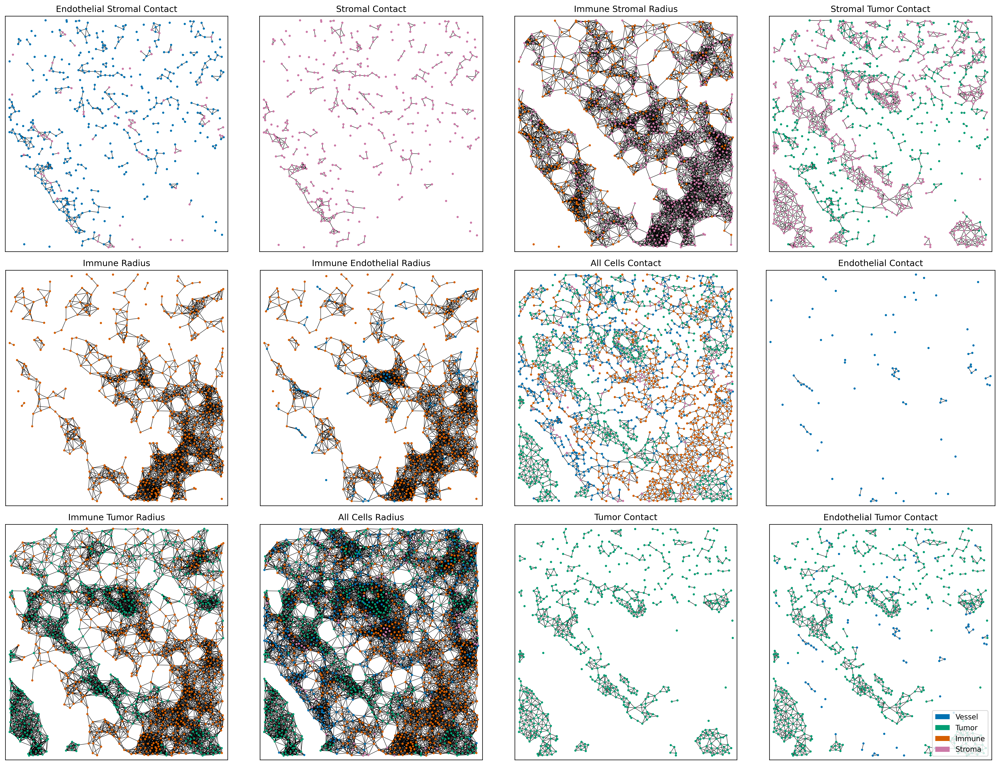

In [10]:
fig, axs = plt.subplots(3, 4, figsize=(20, 15), dpi=300)
i=0
for cfg in cfgs:
    # if cfg["concept_name"] == "all_cells_contact" or cfg["concept_name"] == "all_cells_radius":
    #     next
    if False:
        pass
    else:
        # Plot
        ath.pl.spatial(
            so, 
            spl, 
            'class_id', 
            mode="scatter",
            #mask_key = "cellmasks_radius_20", 
            node_size=4,
            edge_width=0.5,
            edges=True, 
            graph_key=cfg["concept_name"], 
            cbar=False, 
            set_title=False,
            ax=axs.flat[i], 
            cmap=get_colors_map(cfg["concept_params"]["labels"]),
            #cmap_labels=cmap_labels,
            show=False,
            save=None,
            tight_layout=True,
            filter_col=cfg["concept_params"]["filter_col"],
            labels=cfg["concept_params"]["labels"])

        # Remove the axis titles
        axs.flat[i].set_title(transform_string(cfg["concept_name"]))
        axs.flat[i].set_xlabel('')
        axs.flat[i].set_ylabel('')
        i += 1


# Create a list of labels and corresponding colors
labelss = colors.keys()
colorss = colors.values()

# Create a list of colored patches for the legend
patches = [plt.Rectangle((0, 0), 1, 1, fc=color) for color in colorss]

# Add the custom legend
plt.legend(patches, labelss, loc='lower right')
plt.savefig("/Users/ast/Downloads/results/concept_graphs_plus_baselines.png", bbox_inches='tight', dpi=300)
plt.show()